In [1]:
import pandas as pd
import numpy as np
from IPython.display import Markdown
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler

from utils.common.merge_df import (merge_forcast_and_train_df,
                                   remove_NaN_rows)
from utils.common.train_model import (train_model,
                                      train_model_cv,
                                      train_model_stacking,
                                        train_model_stacking_bagging)
from utils.common.test_model import (test_model_cv)
from utils.common.create_features import (create_seasons,
                                          create_datetime_features,
                                          create_adjusted_values,
                                          check_if_in_daylight,
                                          create_rolling_avg,
                                            astral,
                                            deseasonalized_temperature,
                                            create_lag_features)

In [2]:
df_forecast = pd.read_parquet('../Daten/forecasts.parquet')
df_test1 = pd.read_parquet('../Daten/energy_test1.parquet')
df_test2 = pd.read_parquet('../Daten/energy_test2.parquet')
df_train = pd.read_parquet('../Daten/energy_train.parquet')

In [3]:
# entferne alle NaN Werte aus den Daten
df_train, df_forecast = remove_NaN_rows(df_train, df_forecast)


In [4]:

# merge die Daten
merged_df = merge_forcast_and_train_df(df_forecast, df_train)

# merge test 1
merged_test_df = merge_forcast_and_train_df(df_forecast, df_test1)

# merge test 2
merged_test2_df = merge_forcast_and_train_df(df_forecast, df_test2)

In [5]:
# Erstelle Jahreszeiten als categorical feature
#merged_df = await create_seasons(merged_df)

# Erstelle Spalten für Stunden und Monate
merged_df = await create_datetime_features(merged_df)
merged_df = await astral(merged_df)
merged_df = await deseasonalized_temperature(merged_df)

# Erstelle Spalten für die adjustierten Werte
# Können wir wieder auskommentieren wenn wir das wieder testen 
merged_df = await create_adjusted_values(merged_df)
merged_df = await create_rolling_avg(merged_df)
#merged_df = await create_lag_features(merged_df)


# create features for test data
#merged_test_df = await create_seasons(merged_test_df)
#merged_test2_df = await create_seasons(merged_test2_df)

merged_test_df = await create_datetime_features(merged_test_df)
merged_test2_df = await create_datetime_features(merged_test2_df)

merged_test_df = await astral(merged_test_df)
merged_test2_df = await astral(merged_test2_df)

merged_test_df = await deseasonalized_temperature(merged_test_df)
merged_test2_df = await deseasonalized_temperature(merged_test2_df)

merged_test_df = await create_rolling_avg(merged_test_df)
merged_test2_df = await create_rolling_avg(merged_test2_df)

merged_test_df = await create_adjusted_values(merged_test_df)
merged_test2_df = await create_adjusted_values(merged_test2_df)

#merged_test_df = await create_lag_features(merged_test_df)
#merged_test2_df = await create_lag_features(merged_test2_df)

print(merged_df)

/home/datata1/Documents/ML1/Analyse_Training/utils/common/create_features.py:29: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['Rolling_Avg_SolarDownwardRadiation'].fillna(df['Median_SolarDownwardRadiation'], inplace=True)


                            dtm              ref_datetime  Solar_capacity_mwp  \
0     2020-09-21 00:00:00+00:00 2020-09-20 00:00:00+00:00         2130.510089   
1     2020-09-21 00:00:00+00:00 2020-09-20 00:00:00+00:00         2130.510089   
2     2020-09-21 01:00:00+00:00 2020-09-20 00:00:00+00:00         2130.510089   
3     2020-09-21 01:00:00+00:00 2020-09-20 00:00:00+00:00         2130.510089   
4     2020-09-21 02:00:00+00:00 2020-09-20 00:00:00+00:00         2130.510089   
...                         ...                       ...                 ...   
39400 2022-12-31 21:00:00+00:00 2022-12-30 18:00:00+00:00         2212.678300   
39401 2022-12-31 22:00:00+00:00 2022-12-30 18:00:00+00:00         2212.678300   
39402 2022-12-31 22:00:00+00:00 2022-12-30 18:00:00+00:00         2212.678300   
39403 2022-12-31 23:00:00+00:00 2022-12-30 18:00:00+00:00         2237.476835   
39404 2022-12-31 23:00:00+00:00 2022-12-30 18:00:00+00:00         2237.476835   

       Solar_MWh  valid_tim

/home/datata1/Documents/ML1/Analyse_Training/utils/common/create_features.py:29: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['Rolling_Avg_SolarDownwardRadiation'].fillna(df['Median_SolarDownwardRadiation'], inplace=True)
/home/datata1/Documents/ML1/Analyse_Training/utils/common/create_features.py:29: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the interme

In [6]:
merged_df

,dtm,ref_datetime,Solar_capacity_mwp,Solar_MWh,valid_time,SolarDownwardRadiation,CloudCover,Temperature,Weather Model,valid_datetime,...,SolarDownwardRadiation_Temperature,Median_SolarDownwardRadiation,Rolling_Avg_SolarDownwardRadiation,rolling_mean_radiation,rolling_mean_temperature,radiation_rolling_std,radiation_rolling_max,radiation_lag1,radiation_lag2,temp_lag1
0,2020-09-21 00:00:00+00:00,2020-09-20 00:00:00+00:00,2130.510089,0.0,24,0.000000,0.327759,12.216522,DWD ICON,2020-09-21 00:00:00+00:00,...,0.000000,0.000000,0.000000,0.000000,12.228267,0.000000,0.000000,0.000000,0.000000,0.000000
1,2020-09-21 00:00:00+00:00,2020-09-20 00:00:00+00:00,2130.510089,0.0,24,0.000000,0.002000,12.240011,NCEP GFS,2020-09-21 00:00:00+00:00,...,0.000000,0.000000,0.000000,0.002946,12.157506,0.000000,0.000000,0.000000,0.000000,12.216522
2,2020-09-21 01:00:00+00:00,2020-09-20 00:00:00+00:00,2130.510089,0.0,25,0.008838,0.436067,12.015985,DWD ICON,2020-09-21 01:00:00+00:00,...,0.106196,0.004419,0.002946,0.002946,12.096160,0.005103,0.008838,0.000000,0.000000,12.240011
3,2020-09-21 01:00:00+00:00,2020-09-20 00:00:00+00:00,2130.510089,0.0,25,0.000000,0.003000,12.032483,NCEP GFS,2020-09-21 01:00:00+00:00,...,0.000000,0.004419,0.002946,0.008074,11.954034,0.005103,0.008838,0.008838,0.000000,12.015985
4,2020-09-21 02:00:00+00:00,2020-09-20 00:00:00+00:00,2130.510089,0.0,26,0.015384,0.468752,11.813635,DWD ICON,2020-09-21 02:00:00+00:00,...,0.181740,0.007692,0.008074,0.005128,11.893166,0.007720,0.015384,0.000000,0.008838,12.032483
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39400,2022-12-31 21:00:00+00:00,2022-12-30 18:00:00+00:00,2212.678300,0.0,27,0.000000,1.000000,12.386409,NCEP GFS,2022-12-31 21:00:00+00:00,...,0.000000,0.000000,0.000000,0.000000,11.966100,0.000000,0.000000,0.000000,0.000000,11.899714
39401,2022-12-31 22:00:00+00:00,2022-12-30 18:00:00+00:00,2212.678300,0.0,28,0.000000,0.999715,11.612177,DWD ICON,2022-12-31 22:00:00+00:00,...,0.000000,0.000000,0.000000,0.000000,12.177125,0.000000,0.000000,0.000000,0.000000,12.386409
39402,2022-12-31 22:00:00+00:00,2022-12-30 18:00:00+00:00,2212.678300,0.0,28,0.000000,1.000000,12.532788,NCEP GFS,2022-12-31 22:00:00+00:00,...,0.000000,0.000000,0.000000,0.000716,11.762085,0.000000,0.000000,0.000000,0.000000,11.612177
39403,2022-12-31 23:00:00+00:00,2022-12-30 18:00:00+00:00,2237.476835,0.0,29,0.002148,1.000000,11.141291,DWD ICON,2022-12-31 23:00:00+00:00,...,0.023936,0.001074,0.000716,0.000716,12.045937,0.001241,0.002148,0.000000,0.000000,12.532788


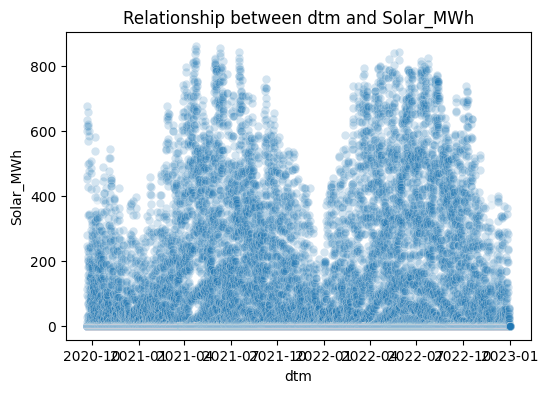

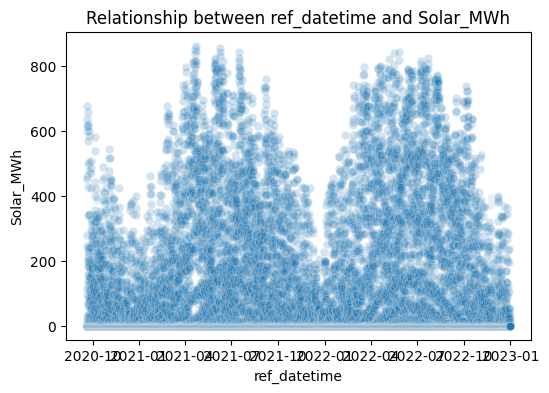

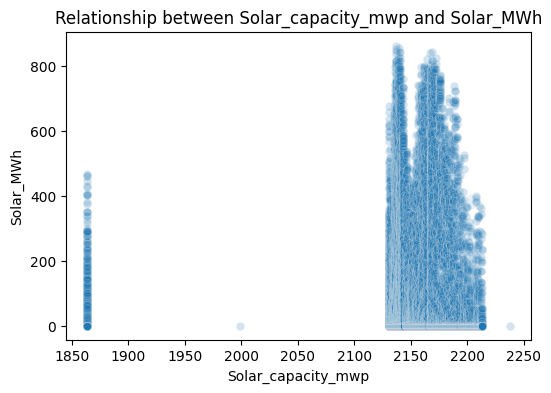

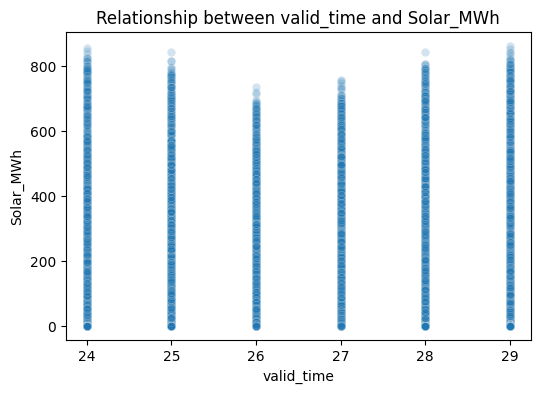

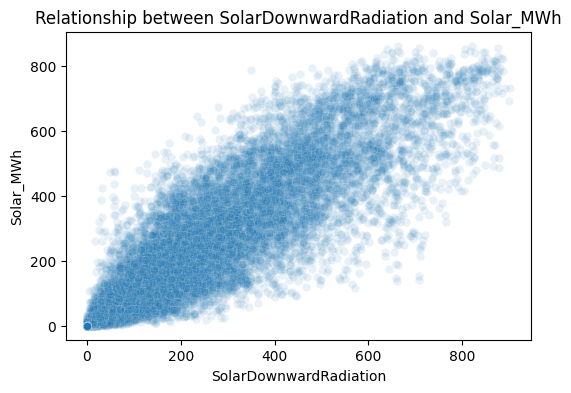

...

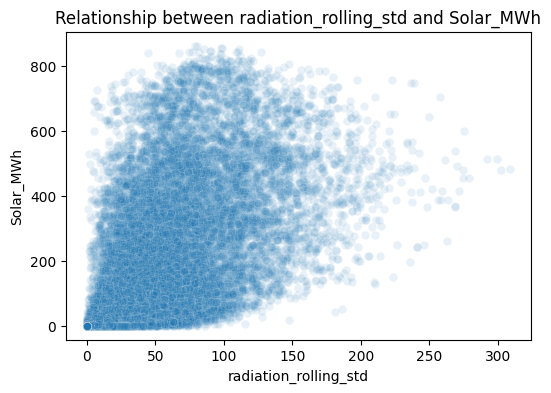

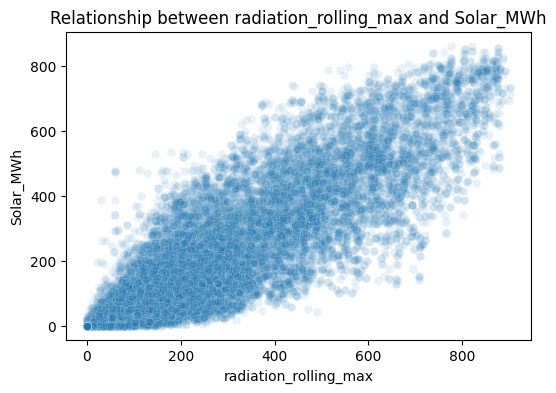

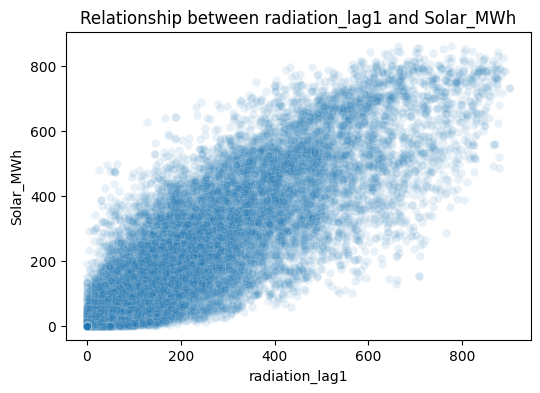

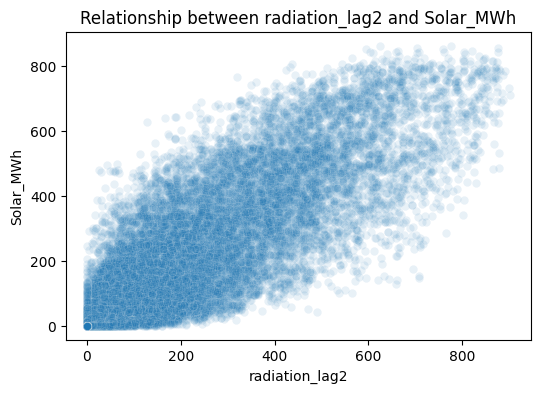

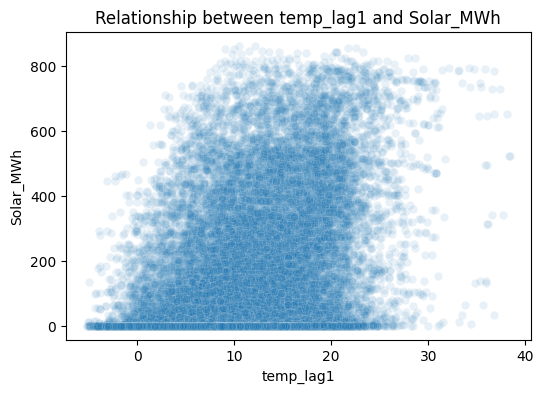

In [7]:
#import seaborn as sns
#import matplotlib.pyplot as plt

# Scatterplot für jedes Feature gegen die Zielvariablen
for feature in merged_df.columns:
    if feature != 'Solar_MWh':  # Zielvariable nicht als Feature verwenden
        plt.figure(figsize=(6, 4))
        sns.scatterplot(x=merged_df[feature], y=merged_df['Solar_MWh'], alpha=0.1)
        plt.title(f'Relationship between {feature} and Solar_MWh')
        plt.show()


In [8]:
param_grid = {
    'alpha': np.linspace(0.1,10,10)
}

merged_df_copy = merged_df.copy()

pipeline, evaluation_md, test_col, best_params = train_model_stacking_bagging(merged_df_copy, 
                                                      ["SolarDownwardRadiation",
                                                      "week",
                                                       "hour",
                                                       "month",
                                                       "rbf_hour_0",
                                                      "rbf_hour_1",
                                                     "rbf_hour_2",
                                                       "rbf_hour_3",
                                                       "rbf_hour_4",
                                                       "rbf_hour_5",
                                                       "rbf_hour_6",
                                                       "rbf_hour_7",
                                                       "rbf_hour_8",
                                                       "rbf_hour_9",
                                                       "rbf_hour_10",
                                                       "rbf_hour_11",
                                                       "rbf_month_0",
                                                       "rbf_month_1",
                                                       "rbf_month_2",
                                                       "rbf_month_3",
                                                       "rbf_month_4",
                                                       "rbf_month_5",
                                                       "rbf_month_6",
                                                       "rbf_month_7",
                                                       "rbf_month_8",
                                                       "rbf_month_9",
                                                       "rbf_month_10",
                                                       "rbf_month_11",
                                                       "sunset", 
                                                       "sunrise",
                                                       'sun_azimuth_sin',
                                                       'sun_azimuth_cos',
                                                       "sun_altitude_sin",
                                                       "sun_altitude_cos",
                                                       "Weather Model",
                                                       "Solar_capacity_mwp",
                                                       "solar_efficiency",
                                                       "SolarDownwardRadiation_CloudCover",
                                                       "SolarDownwardRadiation_Temperature",
                                                       "Median_SolarDownwardRadiation",
                                                       "rolling_mean_radiation",
                                                       #"rolling_mean_temperature",
                                                       "radiation_lag1",
                                                       "radiation_rolling_max",
                                                       "sun_altitude",
                                                       "sun_azimuth",
                                                       #"seasonal_temperature"
                                                                ], 
                                                    "Solar_MWh",
                                                       param_grid)

Starting stacking model training...
One-hot encoding features...
Splitting data...
Base learners optimized!
Optimizing stacking regressor...


In [9]:
display(Markdown(evaluation_md))

### Stacking Model Evaluation

| Dataset | R² | RMSE | MAE | Rows | Columns |
|---------|-------|------|-----|------|----------|
| Train   | 0.95887 | 37.36 | 17.79 | 31524 | 140 |
| Test    | 0.94029 | 44.87 | 21.02 | 7881 | 140 |

Base Learners:
- Ridge Regression
- Random Forest
- XGBoost

Best CV Score (RMSE): 45.01


In [10]:
# scale the data
merged_test_pred_df = test_model_cv(pipeline, merged_test_df, test_col)
merged_test2_pred_df = test_model_cv(pipeline, merged_test2_df, test_col)

/home/datata1/Documents/ML1/Analyse_Training/utils/common/test_model.py:43: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  test_df[col] = 0
/home/datata1/Documents/ML1/Analyse_Training/utils/common/test_model.py:43: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  test_df[col] = 0
/home/datata1/Documents/ML1/Analyse_Training/utils/common/test_model.py:43: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at o

Series([], dtype: int64)
Empty DataFrame
Columns: [dtm, ref_datetime, Solar_capacity_mwp, valid_time, SolarDownwardRadiation, CloudCover, Temperature, Weather Model, valid_datetime, hour, month, week, day_of_year, year, hour_sin, hour_cos, month_sin, month_cos, week_sin, week_cos, day_of_year_sin, day_of_year_cos, rbf_hour_0, rbf_hour_1, rbf_hour_2, rbf_hour_3, rbf_hour_4, rbf_hour_5, rbf_hour_6, rbf_hour_7, rbf_hour_8, rbf_hour_9, rbf_hour_10, rbf_hour_11, rbf_month_0, rbf_month_1, rbf_month_2, rbf_month_3, rbf_month_4, rbf_month_5, rbf_month_6, rbf_month_7, rbf_month_8, rbf_month_9, rbf_month_10, rbf_month_11, rbf_week_0, rbf_week_1, rbf_week_2, rbf_week_3, rbf_week_4, rbf_week_5, rbf_week_6, rbf_week_7, rbf_week_8, rbf_week_9, rbf_week_10, rbf_week_11, sunrise, sunset, dawn, dusk, noon, sun_altitude, sun_altitude_sin, sun_altitude_cos, sun_azimuth, sun_azimuth_sin, sun_azimuth_cos, seasonal_temperature, seasonal_temperature_sin, seasonal_temperature_cos, Median_SolarDownwardRadiatio

/home/datata1/Documents/ML1/Analyse_Training/utils/common/test_model.py:60: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  test_df['Solar_MWh_pred'] = y_pred
/home/datata1/Documents/ML1/Analyse_Training/utils/common/test_model.py:43: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  test_df[col] = 0
/home/datata1/Documents/ML1/Analyse_Training/utils/common/test_model.py:43: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joinin

Series([], dtype: int64)
Empty DataFrame
Columns: [dtm, ref_datetime, Solar_capacity_mwp, valid_time, SolarDownwardRadiation, CloudCover, Temperature, Weather Model, valid_datetime, hour, month, week, day_of_year, year, hour_sin, hour_cos, month_sin, month_cos, week_sin, week_cos, day_of_year_sin, day_of_year_cos, rbf_hour_0, rbf_hour_1, rbf_hour_2, rbf_hour_3, rbf_hour_4, rbf_hour_5, rbf_hour_6, rbf_hour_7, rbf_hour_8, rbf_hour_9, rbf_hour_10, rbf_hour_11, rbf_month_0, rbf_month_1, rbf_month_2, rbf_month_3, rbf_month_4, rbf_month_5, rbf_month_6, rbf_month_7, rbf_month_8, rbf_month_9, rbf_month_10, rbf_month_11, rbf_week_0, rbf_week_1, rbf_week_2, rbf_week_3, rbf_week_4, rbf_week_5, rbf_week_6, rbf_week_7, rbf_week_8, rbf_week_9, rbf_week_10, rbf_week_11, sunrise, sunset, dawn, dusk, noon, sun_altitude, sun_altitude_sin, sun_altitude_cos, sun_azimuth, sun_azimuth_sin, sun_azimuth_cos, seasonal_temperature, seasonal_temperature_sin, seasonal_temperature_cos, Median_SolarDownwardRadiatio

/home/datata1/Documents/ML1/Analyse_Training/utils/common/test_model.py:60: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  test_df['Solar_MWh_pred'] = y_pred


In [11]:
merged_test_pred_df.to_pickle('test1.pkl')
merged_test2_pred_df.to_pickle('test2.pkl')

In [12]:
pd.set_option('display.max_rows', 100)
merged_test_pred_df.head(100)

,dtm,ref_datetime,Solar_capacity_mwp,valid_time,SolarDownwardRadiation,CloudCover,Temperature,Weather Model,valid_datetime,hour,...,week_29,sunset_16,sunrise_4,hour_19,sunset_20,week_52,sunrise_7,week_47,week_8,Solar_MWh_pred
0,2023-01-01 00:00:00+00:00,2022-12-31 00:00:00+00:00,2262.233423,24,0.000000,0.999570,10.612988,DWD ICON,2023-01-01 00:00:00+00:00,0,...,0,0,0,0,0,0,0,0,0,71.306553
1,2023-01-01 00:00:00+00:00,2022-12-31 00:00:00+00:00,2262.233423,24,0.000000,0.995250,11.345912,NCEP GFS,2023-01-01 00:00:00+00:00,0,...,0,0,0,0,0,0,0,0,0,71.306553
2,2023-01-01 01:00:00+00:00,2022-12-31 00:00:00+00:00,2262.233423,25,0.000000,1.000000,10.425348,DWD ICON,2023-01-01 01:00:00+00:00,1,...,0,0,0,0,0,0,0,0,0,72.874073
3,2023-01-01 01:00:00+00:00,2022-12-31 00:00:00+00:00,2262.233423,25,0.000000,0.988300,10.601108,NCEP GFS,2023-01-01 01:00:00+00:00,1,...,0,0,0,0,0,0,0,0,0,72.874073
4,2023-01-01 02:00:00+00:00,2022-12-31 00:00:00+00:00,2262.233423,26,0.021875,1.000000,10.405902,DWD ICON,2023-01-01 02:00:00+00:00,2,...,0,0,0,0,0,0,0,0,0,0.365865
5,2023-01-01 02:00:00+00:00,2022-12-31 00:00:00+00:00,2262.233423,26,0.000000,0.698400,10.188563,NCEP GFS,2023-01-01 02:00:00+00:00,2,...,0,0,0,0,0,0,0,0,0,65.724643
6,2023-01-01 03:00:00+00:00,2022-12-31 00:00:00+00:00,2262.233423,27,0.000000,0.917484,10.113337,DWD ICON,2023-01-01 03:00:00+00:00,3,...,0,0,0,0,0,0,0,0,0,66.578534
7,2023-01-01 03:00:00+00:00,2022-12-31 00:00:00+00:00,2262.233423,27,0.000000,0.615450,9.806490,NCEP GFS,2023-01-01 03:00:00+00:00,3,...,0,0,0,0,0,0,0,0,0,66.578534
8,2023-01-01 04:00:00+00:00,2022-12-31 00:00:00+00:00,2262.233423,28,0.000000,0.794255,9.645734,DWD ICON,2023-01-01 04:00:00+00:00,4,...,0,0,0,0,0,0,0,0,0,67.522033
9,2023-01-01 04:00:00+00:00,2022-12-31 00:00:00+00:00,2262.233423,28,0.000000,0.845300,9.294556,NCEP GFS,2023-01-01 04:00:00+00:00,4,...,0,0,0,0,0,0,0,0,0,67.522033
